New York City Taxi and Limousine Commission data for Green Taxis
This DS challenge is designed to evaluate your skills and intuition regarding a real world data problem. 
Data set: New York City Taxi and Limousine Commission trip records
https://www1.nyc.gov/site/tlc/about/tlc-trip-record-data.page

The yellow and green taxi trip records include fields capturing pick-up and drop-off dates/times, pick-up and drop-off locations, trip distances, itemized fares, rate types, payment types, and driver-reported passenger counts.

We'll use data from Green Taxis for September 2015. 

Load data and analyze:

1. Characterize the data and comment about its quality
2. Explore and visualize the data e.g. a histogram of trip distance
3. Find interesting trip statistics grouped by hour
4. The taxi drivers want to know what kind of trip yields better tips. Can you build a model for them and explain the model?
5. Pick one of the options below
(Option 1) Find an anomaly in the data and explain your findings.
(Option 2) Visualize the data to help understand trip patterns

Please submit the result in the form of runnable notebooks or scripts. A link to GitHub or other code repository would be great.
Please let us know if we need to do anything special to run your notebook (install packages, get extra data etc.)

In [0]:
link="https://drive.google.com/open?id=1CFzqt-Ot1WPkW9pOGg_bYk4B7NJiXeGI"
_,id=link.split("=")

In [0]:
import warnings
warnings.filterwarnings('ignore')

#### Installing Libraries

In [131]:
!pip install geopy
!pip install wget
!pip install geopandas

In [0]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import io
import requests
import datetime as dt
import dask.dataframe as dask_dataframe
import dask.distributed
import scipy

import geopandas
import wget
from geopy.distance import vincenty
from shapely.geometry import Point
from sklearn import metrics
from sklearn.linear_model import RidgeCV, LassoCV
from sklearn.model_selection import RandomizedSearchCV, train_test_split

### This Collab directly imports data from the previous data cleaning done on the Jupyter notebook
#### Datafile name: data_after_dask.csv

In [0]:
!pip install -U -q PyDrive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
# Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

downloaded = drive.CreateFile({'id':id}) 
downloaded.GetContentFile('data_after_dask.csv')  
data = pd.read_csv('data_after_dask.csv')

In [134]:
data.head()

,Unnamed: 0,VendorID,Store_and_fwd_flag,RateCodeID,Pickup_longitude,Pickup_latitude,Dropoff_longitude,Dropoff_latitude,Passenger_count,Trip_distance,Fare_amount,Extra,MTA_tax,Tip_amount,Tolls_amount,Ehail_fee,improvement_surcharge,Total_amount,Payment_type,Trip_type,pickup_date,dropoff_date,distance_calculated,pickup_zone,dropoff_zone
0,0,2,N,5,-73.979485,40.684956,-73.979431,40.685020,1,0.00,7.8,0.0,0.0,1.95,0.0,NaN,0.0,9.75,1,2.0,2015-09-01 00:02:34,2015-09-01 00:02:38,0.005281,25.0,25.0
1,1,2,N,5,-74.010796,40.912216,-74.010780,40.912212,1,0.00,45.0,0.0,0.0,0.00,0.0,NaN,0.0,45.00,1,2.0,2015-09-01 00:04:20,2015-09-01 00:04:24,0.000841,NaN,NaN
2,2,2,N,1,-73.921410,40.766708,-73.914413,40.764687,1,0.59,4.0,0.5,0.5,0.50,0.0,NaN,0.3,5.80,1,1.0,2015-09-01 00:01:50,2015-09-01 00:04:24,0.392664,7.0,7.0
3,3,2,N,1,-73.921387,40.766678,-73.931427,40.771584,1,0.74,5.0,0.5,0.5,0.00,0.0,NaN,0.3,6.30,2,1.0,2015-09-01 00:02:36,2015-09-01 00:06:42,0.626120,7.0,179.0
4,4,2,N,1,-73.955482,40.714046,-73.944412,40.714729,1,0.61,5.0,0.5,0.5,0.00,0.0,NaN,0.3,6.30,2,1.0,2015-09-01 00:00:14,2015-09-01 00:04:20,0.583141,255.0,80.0


In [135]:
data.describe()

,Unnamed: 0,VendorID,RateCodeID,Pickup_longitude,Pickup_latitude,Dropoff_longitude,Dropoff_latitude,Passenger_count,Trip_distance,Fare_amount,Extra,MTA_tax,Tip_amount,Tolls_amount,Ehail_fee,improvement_surcharge,Total_amount,Payment_type,Trip_type,distance_calculated,pickup_zone,dropoff_zone
count,1.494926e+06,1.494926e+06,1.494926e+06,1.494926e+06,1.494926e+06,1.494926e+06,1.494926e+06,1.494926e+06,1.494926e+06,1.494926e+06,1.494926e+06,1.494926e+06,1.494926e+06,1.494926e+06,0.0,1.494926e+06,1.494926e+06,1.494926e+06,1.494922e+06,1.494926e+06,1.491780e+06,1.488380e+06
mean,7.474625e+05,1.782045e+00,1.097653e+00,-7.383084e+01,4.069114e+01,-7.383728e+01,4.069291e+01,1.370598e+00,2.968141e+00,1.254320e+01,3.512800e-01,4.866408e-01,1.235727e+00,1.231047e-01,NaN,2.920991e-01,1.503215e+01,1.540559e+00,1.022353e+00,1.299532e+01,1.172517e+02,1.304193e+02
std,4.315481e+05,4.128570e-01,6.359437e-01,2.776082e+00,1.530882e+00,2.677911e+00,1.476698e+00,1.039426e+00,3.076621e+00,1.008278e+01,3.663096e-01,8.504473e-02,2.431476e+00,8.910137e-01,NaN,5.074009e-02,1.155316e+01,5.232935e-01,1.478288e-01,2.417792e+02,7.754385e+01,7.694744e+01
min,0.000000e+00,1.000000e+00,1.000000e+00,-8.331908e+01,0.000000e+00,-8.342784e+01,0.000000e+00,0.000000e+00,0.000000e+00,-4.750000e+02,-1.000000e+00,-5.000000e-01,-5.000000e+01,-1.529000e+01,NaN,-3.000000e-01,-4.750000e+02,1.000000e+00,1.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00
25%,3.737312e+05,2.000000e+00,1.000000e+00,-7.395961e+01,4.069895e+01,-7.396782e+01,4.069878e+01,1.000000e+00,1.100000e+00,6.500000e+00,0.000000e+00,5.000000e-01,0.000000e+00,0.000000e+00,NaN,3.000000e-01,8.160000e+00,1.000000e+00,1.000000e+00,8.118087e-01,5.200000e+01,6.300000e+01
50%,7.474625e+05,2.000000e+00,1.000000e+00,-7.394536e+01,4.074674e+01,-7.394504e+01,4.074728e+01,1.000000e+00,1.980000e+00,9.500000e+00,5.000000e-01,5.000000e-01,0.000000e+00,0.000000e+00,NaN,3.000000e-01,1.176000e+01,2.000000e+00,1.000000e+00,1.465467e+00,9.300000e+01,1.290000e+02
75%,1.121194e+06,2.000000e+00,1.000000e+00,-7.391748e+01,4.080255e+01,-7.391013e+01,4.079015e+01,1.000000e+00,3.740000e+00,1.550000e+01,5.000000e-01,5.000000e-01,2.000000e+00,0.000000e+00,NaN,3.000000e-01,1.830000e+01,2.000000e+00,1.000000e+00,2.709305e+00,1.810000e+02,1.930000e+02
max,1.494925e+06,2.000000e+00,9.900000e+01,0.000000e+00,4.317726e+01,0.000000e+00,4.279934e+01,9.000000e+00,6.031000e+02,5.805000e+02,1.200000e+01,5.000000e-01,3.000000e+02,9.575000e+01,NaN,3.000000e-01,5.813000e+02,5.000000e+00,2.000000e+00,5.394451e+03,2.630000e+02,2.630000e+02


In [136]:
distance_error = np.array(data["Trip_distance"])-np.array(data["distance_calculated"])
scipy.stats.describe(distance_error)

DescribeResult(nobs=1494926, minmax=(-5394.450658643931, 600.9555568633681), mean=-10.027175596642854, variance=58486.81774493385, skewness=-22.161664931666067, kurtosis=489.15799177968375)

* This cell below is imports LocationID, Borough, Zonename and service name as officially agreed by New York City Taxi and Limousine Commission data for Green Taxis
* The link below is the hyperlink of the data available on the NYC Taxi website [https://www1.nyc.gov/site/tlc/about/tlc-trip-record-data.page]

In [137]:
url=r'https://s3.amazonaws.com/nyc-tlc/misc/taxi+_zone_lookup.csv'
taxi_zone = pd.read_csv(url)
pick_zone = taxi_zone.copy()
drop_zone = taxi_zone.copy()
print(pick_zone.columns)
pick_zone.columns = ['pickup_locationID','pickup_borough','pickup_zonename','pickup_servicezone']
drop_zone.columns = ['dropoff_locationID','dropoff_borough','dropoff_zonename','dropoff_servicezone']
pick_zone.head()

Index(['LocationID', 'Borough', 'Zone', 'service_zone'], dtype='object')


,pickup_locationID,pickup_borough,pickup_zonename,pickup_servicezone
0,1,EWR,Newark Airport,EWR
1,2,Queens,Jamaica Bay,Boro Zone
2,3,Bronx,Allerton/Pelham Gardens,Boro Zone
3,4,Manhattan,Alphabet City,Yellow Zone
4,5,Staten Island,Arden Heights,Boro Zone


In [138]:
drop_zone.head()

,dropoff_locationID,dropoff_borough,dropoff_zonename,dropoff_servicezone
0,1,EWR,Newark Airport,EWR
1,2,Queens,Jamaica Bay,Boro Zone
2,3,Bronx,Allerton/Pelham Gardens,Boro Zone
3,4,Manhattan,Alphabet City,Yellow Zone
4,5,Staten Island,Arden Heights,Boro Zone


In [139]:
result = pd.merge(data,pick_zone,left_on='pickup_zone', right_on='pickup_locationID',how='left')
result.head()

,Unnamed: 0,VendorID,Store_and_fwd_flag,RateCodeID,Pickup_longitude,Pickup_latitude,Dropoff_longitude,Dropoff_latitude,Passenger_count,Trip_distance,Fare_amount,Extra,MTA_tax,Tip_amount,Tolls_amount,Ehail_fee,improvement_surcharge,Total_amount,Payment_type,Trip_type,pickup_date,dropoff_date,distance_calculated,pickup_zone,dropoff_zone,pickup_locationID,pickup_borough,pickup_zonename,pickup_servicezone
0,0,2,N,5,-73.979485,40.684956,-73.979431,40.685020,1,0.00,7.8,0.0,0.0,1.95,0.0,NaN,0.0,9.75,1,2.0,2015-09-01 00:02:34,2015-09-01 00:02:38,0.005281,25.0,25.0,25.0,Brooklyn,Boerum Hill,Boro Zone
1,1,2,N,5,-74.010796,40.912216,-74.010780,40.912212,1,0.00,45.0,0.0,0.0,0.00,0.0,NaN,0.0,45.00,1,2.0,2015-09-01 00:04:20,2015-09-01 00:04:24,0.000841,NaN,NaN,NaN,NaN,NaN,NaN
2,2,2,N,1,-73.921410,40.766708,-73.914413,40.764687,1,0.59,4.0,0.5,0.5,0.50,0.0,NaN,0.3,5.80,1,1.0,2015-09-01 00:01:50,2015-09-01 00:04:24,0.392664,7.0,7.0,7.0,Queens,Astoria,Boro Zone
3,3,2,N,1,-73.921387,40.766678,-73.931427,40.771584,1,0.74,5.0,0.5,0.5,0.00,0.0,NaN,0.3,6.30,2,1.0,2015-09-01 00:02:36,2015-09-01 00:06:42,0.626120,7.0,179.0,7.0,Queens,Astoria,Boro Zone
4,4,2,N,1,-73.955482,40.714046,-73.944412,40.714729,1,0.61,5.0,0.5,0.5,0.00,0.0,NaN,0.3,6.30,2,1.0,2015-09-01 00:00:14,2015-09-01 00:04:20,0.583141,255.0,80.0,255.0,Brooklyn,Williamsburg (North Side),Boro Zone


In [140]:
result = pd.merge(result,drop_zone,left_on='dropoff_zone', right_on='dropoff_locationID',how='left')
result.head()

,Unnamed: 0,VendorID,Store_and_fwd_flag,RateCodeID,Pickup_longitude,Pickup_latitude,Dropoff_longitude,Dropoff_latitude,Passenger_count,Trip_distance,Fare_amount,Extra,MTA_tax,Tip_amount,Tolls_amount,Ehail_fee,improvement_surcharge,Total_amount,Payment_type,Trip_type,pickup_date,dropoff_date,distance_calculated,pickup_zone,dropoff_zone,pickup_locationID,pickup_borough,pickup_zonename,pickup_servicezone,dropoff_locationID,dropoff_borough,dropoff_zonename,dropoff_servicezone
0,0,2,N,5,-73.979485,40.684956,-73.979431,40.685020,1,0.00,7.8,0.0,0.0,1.95,0.0,NaN,0.0,9.75,1,2.0,2015-09-01 00:02:34,2015-09-01 00:02:38,0.005281,25.0,25.0,25.0,Brooklyn,Boerum Hill,Boro Zone,25.0,Brooklyn,Boerum Hill,Boro Zone
1,1,2,N,5,-74.010796,40.912216,-74.010780,40.912212,1,0.00,45.0,0.0,0.0,0.00,0.0,NaN,0.0,45.00,1,2.0,2015-09-01 00:04:20,2015-09-01 00:04:24,0.000841,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,2,N,1,-73.921410,40.766708,-73.914413,40.764687,1,0.59,4.0,0.5,0.5,0.50,0.0,NaN,0.3,5.80,1,1.0,2015-09-01 00:01:50,2015-09-01 00:04:24,0.392664,7.0,7.0,7.0,Queens,Astoria,Boro Zone,7.0,Queens,Astoria,Boro Zone
3,3,2,N,1,-73.921387,40.766678,-73.931427,40.771584,1,0.74,5.0,0.5,0.5,0.00,0.0,NaN,0.3,6.30,2,1.0,2015-09-01 00:02:36,2015-09-01 00:06:42,0.626120,7.0,179.0,7.0,Queens,Astoria,Boro Zone,179.0,Queens,Old Astoria,Boro Zone
4,4,2,N,1,-73.955482,40.714046,-73.944412,40.714729,1,0.61,5.0,0.5,0.5,0.00,0.0,NaN,0.3,6.30,2,1.0,2015-09-01 00:00:14,2015-09-01 00:04:20,0.583141,255.0,80.0,255.0,Brooklyn,Williamsburg (North Side),Boro Zone,80.0,Brooklyn,East Williamsburg,Boro Zone


In [0]:
result.drop(columns=['pickup_locationID','dropoff_locationID'],inplace=True)

In [142]:
result.head()

,Unnamed: 0,VendorID,Store_and_fwd_flag,RateCodeID,Pickup_longitude,Pickup_latitude,Dropoff_longitude,Dropoff_latitude,Passenger_count,Trip_distance,Fare_amount,Extra,MTA_tax,Tip_amount,Tolls_amount,Ehail_fee,improvement_surcharge,Total_amount,Payment_type,Trip_type,pickup_date,dropoff_date,distance_calculated,pickup_zone,dropoff_zone,pickup_borough,pickup_zonename,pickup_servicezone,dropoff_borough,dropoff_zonename,dropoff_servicezone
0,0,2,N,5,-73.979485,40.684956,-73.979431,40.685020,1,0.00,7.8,0.0,0.0,1.95,0.0,NaN,0.0,9.75,1,2.0,2015-09-01 00:02:34,2015-09-01 00:02:38,0.005281,25.0,25.0,Brooklyn,Boerum Hill,Boro Zone,Brooklyn,Boerum Hill,Boro Zone
1,1,2,N,5,-74.010796,40.912216,-74.010780,40.912212,1,0.00,45.0,0.0,0.0,0.00,0.0,NaN,0.0,45.00,1,2.0,2015-09-01 00:04:20,2015-09-01 00:04:24,0.000841,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,2,N,1,-73.921410,40.766708,-73.914413,40.764687,1,0.59,4.0,0.5,0.5,0.50,0.0,NaN,0.3,5.80,1,1.0,2015-09-01 00:01:50,2015-09-01 00:04:24,0.392664,7.0,7.0,Queens,Astoria,Boro Zone,Queens,Astoria,Boro Zone
3,3,2,N,1,-73.921387,40.766678,-73.931427,40.771584,1,0.74,5.0,0.5,0.5,0.00,0.0,NaN,0.3,6.30,2,1.0,2015-09-01 00:02:36,2015-09-01 00:06:42,0.626120,7.0,179.0,Queens,Astoria,Boro Zone,Queens,Old Astoria,Boro Zone
4,4,2,N,1,-73.955482,40.714046,-73.944412,40.714729,1,0.61,5.0,0.5,0.5,0.00,0.0,NaN,0.3,6.30,2,1.0,2015-09-01 00:00:14,2015-09-01 00:04:20,0.583141,255.0,80.0,Brooklyn,Williamsburg (North Side),Boro Zone,Brooklyn,East Williamsburg,Boro Zone


In [143]:
result["pickup_servicezone"].value_counts()

Boro Zone      1471243
Yellow Zone      19786
Airports           711
EWR                 40
Name: pickup_servicezone, dtype: int64

In [144]:
result["pickup_borough"].value_counts()

Brooklyn         567972
Manhattan        426106
Queens           412820
Bronx             84740
Staten Island       102
EWR                  40
Name: pickup_borough, dtype: int64

In [0]:
def get_hours(result,column_name):
    """
    Getting the hour of the day
    Input: 
        result: DataFrame
        Column_name: column from which hours have to be extracted
    Output: 
        Pandas series of the hours
    """
    return result[column_name].dt.hour

def get_day(result,column_name):
    """
    Getting the weekday of the day
    Input: 
        result: DataFrame
        Column_name: column from which weekday have to be extracted
    Output: 
        Pandas series of the weekday
    """
    return result[column_name].dt.weekday_name
  
result['pickup_date'] = pd.to_datetime(result['pickup_date'], errors='coerce')
result['dropoff_date'] = pd.to_datetime(result['dropoff_date'], errors='coerce')

result['pickup_hr'] = get_hours(result,'pickup_date')
result['dropoff_hr'] = get_hours(result,'dropoff_date')

result['pickup_day'] = get_day(result,'pickup_date')
result['dropoff_day'] = get_day(result,'dropoff_date')

In [146]:
result.head()

,Unnamed: 0,VendorID,Store_and_fwd_flag,RateCodeID,Pickup_longitude,Pickup_latitude,Dropoff_longitude,Dropoff_latitude,Passenger_count,Trip_distance,Fare_amount,Extra,MTA_tax,Tip_amount,Tolls_amount,Ehail_fee,improvement_surcharge,Total_amount,Payment_type,Trip_type,pickup_date,dropoff_date,distance_calculated,pickup_zone,dropoff_zone,pickup_borough,pickup_zonename,pickup_servicezone,dropoff_borough,dropoff_zonename,dropoff_servicezone,pickup_hr,dropoff_hr,pickup_day,dropoff_day
0,0,2,N,5,-73.979485,40.684956,-73.979431,40.685020,1,0.00,7.8,0.0,0.0,1.95,0.0,NaN,0.0,9.75,1,2.0,2015-09-01 00:02:34,2015-09-01 00:02:38,0.005281,25.0,25.0,Brooklyn,Boerum Hill,Boro Zone,Brooklyn,Boerum Hill,Boro Zone,0,0,Tuesday,Tuesday
1,1,2,N,5,-74.010796,40.912216,-74.010780,40.912212,1,0.00,45.0,0.0,0.0,0.00,0.0,NaN,0.0,45.00,1,2.0,2015-09-01 00:04:20,2015-09-01 00:04:24,0.000841,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,Tuesday,Tuesday
2,2,2,N,1,-73.921410,40.766708,-73.914413,40.764687,1,0.59,4.0,0.5,0.5,0.50,0.0,NaN,0.3,5.80,1,1.0,2015-09-01 00:01:50,2015-09-01 00:04:24,0.392664,7.0,7.0,Queens,Astoria,Boro Zone,Queens,Astoria,Boro Zone,0,0,Tuesday,Tuesday
3,3,2,N,1,-73.921387,40.766678,-73.931427,40.771584,1,0.74,5.0,0.5,0.5,0.00,0.0,NaN,0.3,6.30,2,1.0,2015-09-01 00:02:36,2015-09-01 00:06:42,0.626120,7.0,179.0,Queens,Astoria,Boro Zone,Queens,Old Astoria,Boro Zone,0,0,Tuesday,Tuesday
4,4,2,N,1,-73.955482,40.714046,-73.944412,40.714729,1,0.61,5.0,0.5,0.5,0.00,0.0,NaN,0.3,6.30,2,1.0,2015-09-01 00:00:14,2015-09-01 00:04:20,0.583141,255.0,80.0,Brooklyn,Williamsburg (North Side),Boro Zone,Brooklyn,East Williamsburg,Boro Zone,0,0,Tuesday,Tuesday


### Characterize the data and comment about its quality

After getting to understand the description of the data. There are couple imperfection in data quality
1. Considering the location of New York
    - The latitude of any location (either pickup or drop) should be positive.
    - The longitude of any location (either pickup or drop) should be negative.
    - These rows can be removed by filtering rows having valid pickup/dropoff zones
2. Passenger count can't less than 0
3. Distance should in (0,Threshold).
    - Threshold = 4 Std from the median vlaue
4. All amounts($ - Fare_amount, Extra, MTA_tax, Tip_amount, Tolls_amount, improvement_surcharge, Total_amount) can't be negative
5. Trip duration should in (0,Threshold). 
    - Lets sat threshold=200 minutes

We will have to clean the data based on which task we are accomplishing

In [0]:
data = result.copy()

#### Removing rows with location outside New York

In [148]:
condition = data["dropoff_zone"].isnull() | data["pickup_zone"].isnull()
print("Data having pickup zone or drop zone outside New York:",data[condition].shape)
data = data[~condition]
print("Remaining Data:",data.shape)

Data having pickup zone or drop zone outside New York: (8643, 35)
Remaining Data: (1486283, 35)


#### Removing rows with number of passenger negative

In [149]:
condition = data["Passenger_count"].isnull() | data["Passenger_count"]<=0
print("Data with wrong number of passendger:",data[condition].shape)
data = data[~condition]
print("Remaining Data:",data.shape)

Data with wrong number of passendger: (420, 35)
Remaining Data: (1485863, 35)


#### Removing rows with negative amounts

In [150]:
condition = (data['Fare_amount']<2.5)|(data['Extra']<0)|(data['MTA_tax']<0)|(data['Tip_amount']<0)|(data['Tolls_amount']<0)|(data['improvement_surcharge']<0)|(data['Total_amount']<2.5)
print("Data with wrong amounts:",data[condition].shape)
data = data[~condition]
print("Remaining Data:",data.shape)

Data with wrong amounts: (6826, 35)
Remaining Data: (1479037, 35)


#### Removing rows with very large trip duration or negative

In [151]:
data['trip_time'] = (data['dropoff_date'] - data['pickup_date']).astype('timedelta64[m]')

condition = (data['trip_time']<=0) | (data['trip_time']>200)
print("Data with wrong trip durations:",data[condition].shape)
data = data[~condition]
print("Remaining Data:",data.shape)

Data with wrong trip durations: (30184, 36)
Remaining Data: (1448853, 36)


### Adding average speed of the ride column
* Column name: trip_speed
* miles/hour

In [0]:
#Speed
data['trip_speed'] = data['Trip_distance']*60 / data['trip_time']

### Adding Tip percentage column
* Column name: Tip_percent_amount
* Tip(%)*100/Fare_amount($)

In [0]:
#Tip percentage of Fare amount
data['Tip_percent_amount']=data['Tip_amount']*100/data['Fare_amount']

### Adding Tip per time column
* Column name: Tip_percent_time
* Tip($)*100/trip time(in mins)

In [0]:
#Tip percentage of trip duration
data['Tip_percent_time']=data['Tip_amount']*100/data['trip_time']

#### Removing rows with very large proporation of tips

In [155]:
condition = (data['Tip_percent_amount']>50)
print("Data with wrong amounts:",data[condition].shape)
data = data[~condition]
print("Remaining Data:",data.shape)

Data with wrong amounts: (4733, 39)
Remaining Data: (1444120, 39)


#### Removing rows with impossible speeds

In [156]:
condition = (data['trip_speed']>150) | (data['trip_speed']<0)
print("Data with wrong amounts:",data[condition].shape)
data = data[~condition]
print("Remaining Data:",data.shape)

Data with wrong amounts: (162, 39)
Remaining Data: (1443958, 39)


#### Trip distance analyis

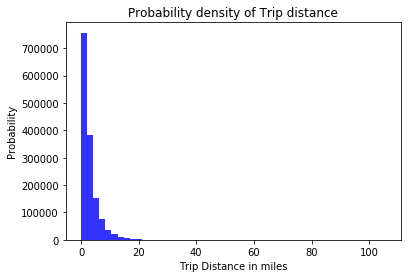

In [157]:
plt.hist(data['Trip_distance'], 50, facecolor='blue', alpha=0.8)
plt.xlabel('Trip Distance in miles')
plt.ylabel('Probability')
plt.title(r'Probability density of Trip distance')
plt.show()

#### This clearly shows that this is log-normal distribution. Moreover we will have to remove outliers before we go forward with the analysis. 
1. This is very positively skewed distribution
2. to remover outlier condier data from between Min and Mean-4*Standard _deviation

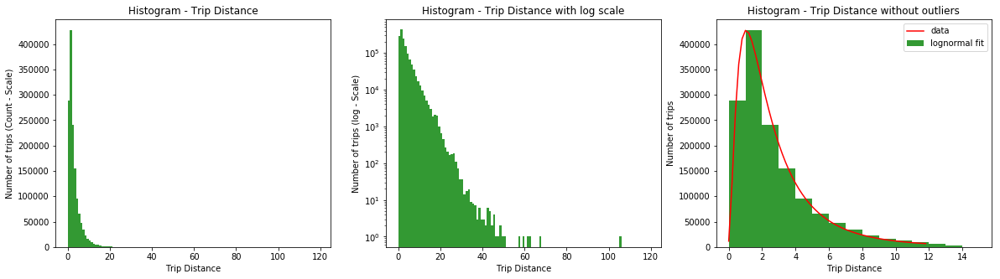

In [158]:
from scipy.stats import lognorm
fig,ax = plt.subplots(1,3,figsize = (20,5))
dist = data['Trip_distance']

ax[0].hist(dist,bins=range(0,120,1),facecolor='green', alpha=0.8)
ax[1].hist(dist,bins=range(0,120,1),facecolor='green', alpha=0.8)
ax[2].hist(dist[~((dist-dist.median()).abs()>4*dist.std())],bins=range(0,16,1),facecolor='green', alpha=0.8)


ax[0].set_xlabel('Trip Distance')
ax[0].set_ylabel('Number of trips (Count - Scale)')
ax[0].set_title('Histogram - Trip Distance')

ax[1].set_xlabel('Trip Distance')
ax[1].set_ylabel('Number of trips (log - Scale)')
ax[1].set_yscale('log')
ax[1].set_title('Histogram - Trip Distance with log scale')


ax[2].set_xlabel('Trip Distance')
ax[2].set_ylabel('Number of trips')
ax[2].set_title('Histogram - Trip Distance without outliers')

# Fit line
scatter,loc,mean = lognorm.fit(data["Trip_distance"].values,scale=data.Trip_distance.mean(),loc=0)
pdf_fitted = lognorm.pdf(np.arange(0,12,.2),scatter,loc,mean)
ax[2].plot(np.arange(0,12,.2),1400000*pdf_fitted,'r') 
ax[2].legend(['data','lognormal fit'])

plt.show()

The Trip Distance is positively asymmetrically skewed distributed. The skewness is due to high concentration of the rides towards lower bound(=0). This is a structure of a lognormal distribution. 
1. Left graph, density histograms. Entire dataset after intuitive data removal above
2. Middle, density axis(y) is converted to logarithmic scale
3. Right graph, outliers are removed. Outliers: points located further than 4 standard deviations from the median

The trips are not random becuase its not normal distribution. 

### Visualization and data analysis

In [0]:
def pickup_groupby(data):
    """
    Groupby the data by column='pickup_zone'. Operator: Count
    Input: 
        data: DataFrame, Taxi data after joined with taxi zone data
    Output: 
        DataFrame with index='pickup_zone'
    
    """
    count_pickup_zone = data.groupby('pickup_zone').count()
    count_pickup_zone.columns=["count_pick_zone"]
    return count_pickup_zone

def dropoff_groupby(data):
    """
    Groupby the data by column='dropoff_zone'. Operator: Count
    Input: 
        data: DataFrame, Taxi data after joined with taxi zone data
    Output: 
        DataFrame with index='dropoff_zone'
    
    """
    count_dropoff_zone = data.groupby('dropoff_zone').count()
    count_dropoff_zone.columns=["count_dropoff_zone"]
    return count_dropoff_zone

In [0]:
import bokeh, bokeh.plotting, bokeh.models
from bokeh.io import output_notebook, show, output_file, curdoc
from bokeh.layouts import row, column
from bokeh.models import ColumnDataSource, Slider
from bokeh.plotting import figure

output_notebook()
def bokeh_map(df):
    """
    Show New york city with Heat map
    Input: 
        data: DataFrame
    Output: 
        show()
    
    """
    
    gjds = bokeh.models.GeoJSONDataSource(geojson=df.to_json())
    
    tool_list = ['pan','wheel_zoom','reset','hover','lasso_select', 'tap']
    pickup = bokeh.plotting.figure(title="NYC Green Taxi Pickup", tools=tool_list,plot_width=500, plot_height=500)
    dropoff = bokeh.plotting.figure(title="NYC Green taxi Dropoff", tools=tool_list,plot_width=500, plot_height=500)

    blue = bokeh.models.LogColorMapper(palette=bokeh.palettes.Blues9[::-1],low=1, high=5000)
    green = bokeh.models.LogColorMapper(palette=bokeh.palettes.Greens9[::-1],low=1, high=5000)

    pickup.patches('xs', 'ys', fill_color={'field': 'count_pick_zone', 'transform': blue},
                   fill_alpha=1, line_color="gray",source=gjds)

    
    dropoff.patches('xs', 'ys', fill_color={'field': 'count_dropoff_zone', 'transform': green},
                    fill_alpha=1, line_color="gray",source=gjds)

    
    pickup.grid.grid_line_color = None
    dropoff.grid.grid_line_color = None

    hover_pickup = pickup.select_one(bokeh.models.HoverTool)
    hover_pickup.point_policy = "follow_mouse"
    hover_pickup.tooltips = u"""
    <div> 
        <div class="bokeh_hover_tooltip">Name : @zone</div>
        <div class="bokeh_hover_tooltip">Trips Start : @count_pick_zone</div>
    </div>
    """
    
    hover_dropoff = dropoff.select_one(bokeh.models.HoverTool)
    hover_dropoff.point_policy = "follow_mouse"
    hover_dropoff.tooltips = u"""
    <div> 
        <div class="bokeh_hover_tooltip">Name : @zone</div>
        <div class="bokeh_hover_tooltip">Trips Start : @count_dropoff_zone</div>
    </div>
    """

    blue_bar = bokeh.models.ColorBar(color_mapper=blue, 
                                     orientation='horizontal',
                                     ticker=bokeh.models.FixedTicker(ticks=[5, 10, 50, 100, 500, 1000, 5000, 10000]),
                                     formatter=bokeh.models.PrintfTickFormatter(format='%d'),
                                     label_standoff=12, 
                                     border_line_color=None, 
                                     location=(0,0))
    pickup.add_layout(blue_bar, 'above')
    
    green_bar = bokeh.models.ColorBar(color_mapper=green, 
                                      orientation='horizontal',
                                      ticker=bokeh.models.FixedTicker(ticks=[5, 10, 50, 100, 500, 1000, 5000, 10000]),
                                      formatter=bokeh.models.PrintfTickFormatter(format='%d'),
                                      label_standoff=12, 
                                      border_line_color=None, 
                                      location=(0,0))
    dropoff.add_layout(green_bar, 'above')    
    p = row(pickup, dropoff)
    show(p)

This cell below loads shape file (compatible with geopandas) to chart different taxi zones on Bokeh map

The link below is the hyperlink of the data available on the NYC Taxi website [https://www1.nyc.gov/site/tlc/about/tlc-trip-record-data.page]

In [0]:
import ssl
import zipfile
ssl._create_default_https_context = ssl._create_unverified_context
wget.download('https://archive.nyu.edu/bitstream/2451/36743/3/nyu_2451_36743_WGS84.zip')
zipfile.ZipFile('nyu_2451_36743_WGS84.zip', 'r').extractall()

In [0]:
df_shape = geopandas.read_file('nyu_2451_36743_WGS84/nyu_2451_36743.shp').to_crs({'init': 'epsg:4326'})
df_shape = df_shape.drop(['Shape_Area', 'Shape_Leng', 'OBJECTID'], axis=1)

def generate_bokeh_data(df_shape,data):
    bokeh_data = df_shape.merge(pickup_groupby(data[["pickup_zone",'dropoff_zone']]), 
                          left_on='LocationID', 
                          right_index=True, 
                          how='left')

    bokeh_data = bokeh_data.merge(dropoff_groupby(data[["pickup_zone",'dropoff_zone']]), 
                                  left_on='LocationID', 
                                  right_index=True, 
                                  how='left')
    
    return bokeh_data

In [163]:
generate_bokeh_data(df_shape,data).head()

,zone,LocationID,borough,geometry,count_pick_zone,count_dropoff_zone
0,Newark Airport,1,EWR,"POLYGON ((-74.18445 40.69500, -74.18449 40.695...",10.0,639.0
1,Jamaica Bay,2,Queens,"MULTIPOLYGON (((-73.82338 40.63899, -73.82277 ...",2.0,4.0
2,Allerton/Pelham Gardens,3,Bronx,"POLYGON ((-73.84793 40.87134, -73.84725 40.870...",192.0,756.0
3,Alphabet City,4,Manhattan,"POLYGON ((-73.97177 40.72582, -73.97179 40.725...",NaN,2435.0
4,Arden Heights,5,Staten Island,"POLYGON ((-74.17422 40.56257, -74.17349 40.562...",NaN,4.0


In [164]:
bokeh_map(generate_bokeh_data(df_shape,data))

The Pickups are not evenly distributed. they are mostly concentrated on the regions touching the East River i.e. boundary between Manhattan and Queens or Brooklyn. There are not pickups in the Downtown Manhattan regions because of the regional aggrement between Green and Yello Taxi associations. 
 
1. Harlem has very high density of pickups as well as dropoffs
2. Outskirts of NYC relatively use less of Green Taxis


### Hourly study

In [0]:
# Mean / Median for hourly study
def hourly_distance(data):
    hr_dist = pd.DataFrame(data[['Trip_distance','pickup_hr']].groupby(by='pickup_hr').mean())
    hr_dist['Medium_trip_distance']=data[['Trip_distance','pickup_hr']].groupby(by='pickup_hr').median()
    hr_dist.columns=['Mean_trip_distance','Median_trip_distance']
    return hr_dist

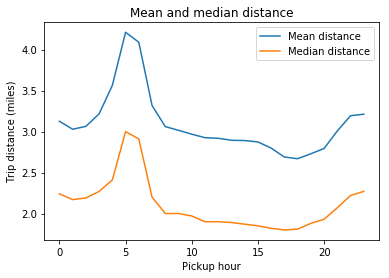

In [166]:
plt.plot(hourly_distance(data));
plt.xlabel('Pickup hour')
plt.ylabel('Trip distance (miles)')
plt.title('Mean and median distance')
plt.legend(['Mean distance', 'Median distance'])

The average trip distance is very high during early morning and late nights. This reflects the lifestyle of NYC. 
1. City that never sleeps
2. People start commuting for the work early in the morning
3.Late Night event culture

In [167]:
data['pickup_borough'].unique()

array(['Queens', 'Brooklyn', 'Manhattan', 'Bronx', 'Staten Island', 'EWR'],
      dtype=object)

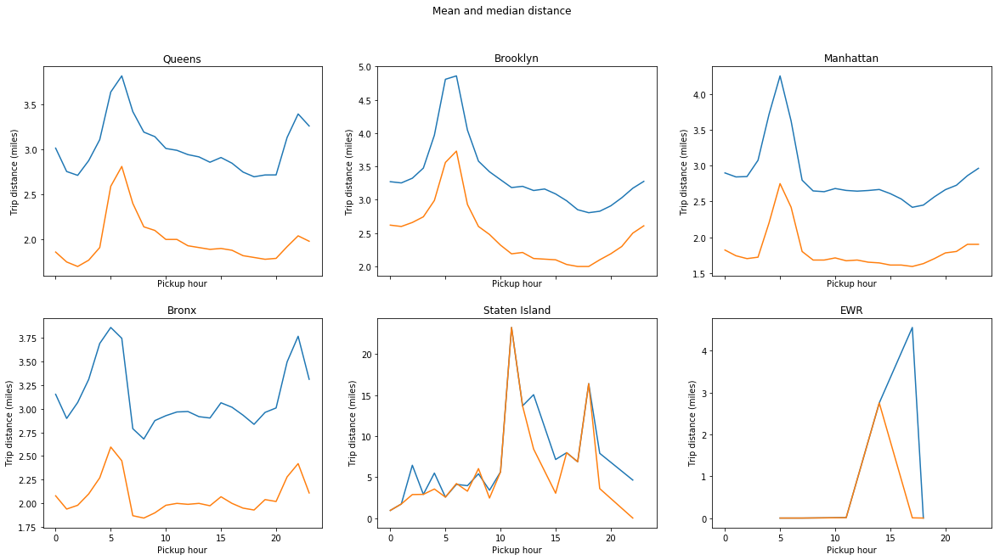

In [168]:
fig,ax = plt.subplots(2,3,figsize = (20,10),sharex=True)
fig.suptitle('Mean and median distance')
borough = data['pickup_borough'].unique()

for i in range(len(borough)):
    ax[i//3,i%3].plot(hourly_distance(data[data['pickup_borough']==borough[i]]))
    ax[i//3,i%3].set_title(borough[i])
    ax[i//3,i%3].set_xlabel('Pickup hour')
    ax[i//3,i%3].set_ylabel('Trip distance (miles)')

plt.show()


The main 4 boroughs show similar reuslt as of average NYC graph.
Average ride distance for the pickps in Manhattan and Brooklyn is little higher than Bronx and Queens. Rides in Staten Island are realtively randomised, moreover we don't have large to comment something concrete on Staten Island and EWR 

In [0]:
pick_count_borough = data[['pickup_hr','pickup_borough','pickup_zonename']].groupby(['pickup_borough','pickup_hr']).count()

In [170]:
pick_count_borough.loc['Bronx']

,pickup_zonename
pickup_hr,
0,2385
1,1812
2,1249
3,862
4,861
5,702
6,1359
7,3183
8,4326


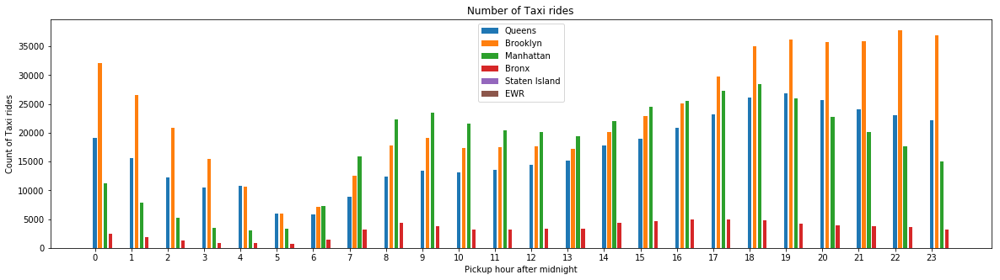

In [171]:
labels = borough
width = 0.10  # the width of the bars

fig, ax = plt.subplots(1,1,figsize = (20,5))
for i in range(len(labels)):
    x = pick_count_borough.loc[labels[i]].index
    ax.bar(x + width*i*1.4,pick_count_borough.loc[labels[i]].pickup_zonename, width, label=labels[i])

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Count of Taxi rides')
ax.set_xlabel('Pickup hour after midnight')
ax.set_title('Number of Taxi rides')
ax.set_xticks(np.arange(0, 24, step=1))
ax.legend()

plt.show()

This graph offer interesting insghts about Taxi usage in different boroughs. 
1. Brooklyn has most rides outside the normal woring hours
2. Overall it trends number of rides peak between 8 PM and 12 AM
3. If everything remaining same, if a taxi want to serve as mutch passengers as possible, Manhattan during daytime and Brooklyn during late evenings

### Creating new variables

In [0]:
tip_amount_borough = data[['pickup_hr','pickup_borough','Tip_percent_amount']].groupby(['pickup_borough','pickup_hr']).mean()

In [173]:
tip_amount_borough.loc['Bronx']

,Tip_percent_amount
pickup_hr,
0,3.960174
1,3.626431
2,3.495503
3,3.501171
4,2.902049
5,3.049880
6,2.986717
7,2.942386
8,3.089012


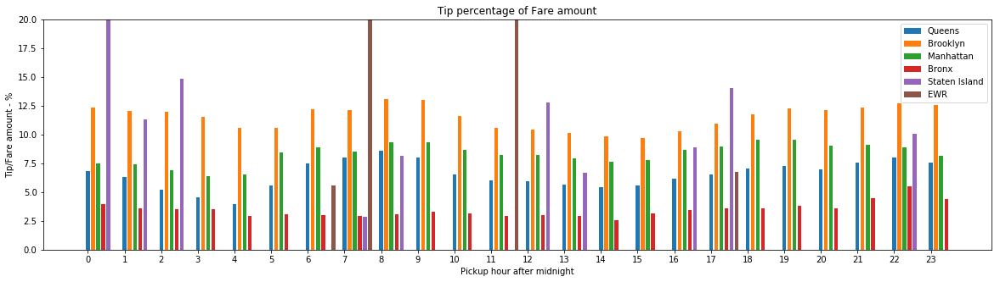

In [174]:
labels = borough
width = 0.10  # the width of the bars

fig, ax = plt.subplots(1,1,figsize = (20,5))
for i in range(len(labels)):
    x = tip_amount_borough.loc[labels[i]].index
    ax.bar(x + width*i*1.4,tip_amount_borough.loc[labels[i]].Tip_percent_amount, width, label=labels[i])


ax.set_ylabel('Tip/Fare amount - %')
ax.set_xlabel('Pickup hour after midnight')
ax.set_title('Tip percentage of Fare amount')
ax.set_xticks(np.arange(0, 24, step=1))
ax.set_ylim(top=20)
ax.legend()

plt.show()

General trend coming out is trips originating from the Brooklyn tends to pay higher tip percentage of the base fare amount. Next is Manhattan.
1. This suggest aviod Bronx
2. Try to get large number of pickups from Brooklyn region

In [0]:
tip_time_borough = data[['pickup_hr','pickup_borough','Tip_percent_time']].groupby(['pickup_borough','pickup_hr']).mean()

In [176]:
tip_time_borough.loc['Bronx']

,Tip_percent_time
pickup_hr,
0,5.441085
1,5.278672
2,4.987556
3,5.896547
4,5.427987
5,4.838192
6,3.946534
7,3.556282
8,3.622260


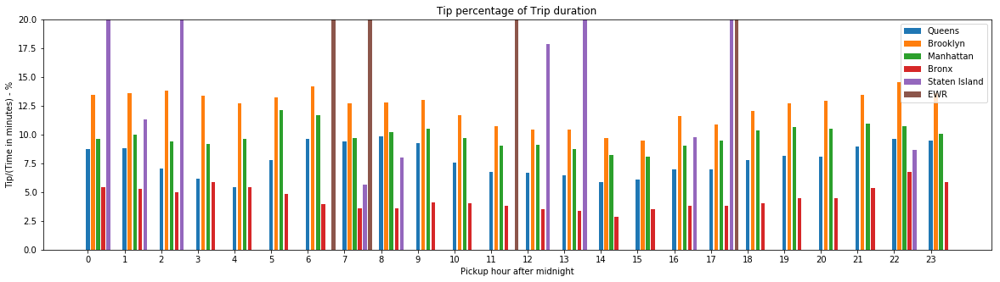

In [177]:
labels = borough
width = 0.10  # the width of the bars

fig, ax = plt.subplots(1,1,figsize = (20,5))
for i in range(len(labels)):
    x = tip_time_borough.loc[labels[i]].index
    ax.bar(x + width*i*1.4,tip_time_borough.loc[labels[i]].Tip_percent_time, width, label=labels[i])


ax.set_ylabel('Tip/(Time in minutes) - %')
ax.set_xlabel('Pickup hour after midnight')
ax.set_title('Tip percentage of Trip duration')
ax.set_xticks(np.arange(0, 24, step=1))
ax.set_ylim(top=20)
ax.legend()

plt.show()

In [0]:
tip_ride_borough = data[['pickup_hr','pickup_borough','Tip_amount']].groupby(['pickup_borough','pickup_hr']).mean()

In [179]:
tip_ride_borough.loc['Bronx']

,Tip_amount
pickup_hr,
0,0.574138
1,0.451722
2,0.437774
3,0.536346
4,0.491661
5,0.490798
6,0.491141
7,0.395347
8,0.382658


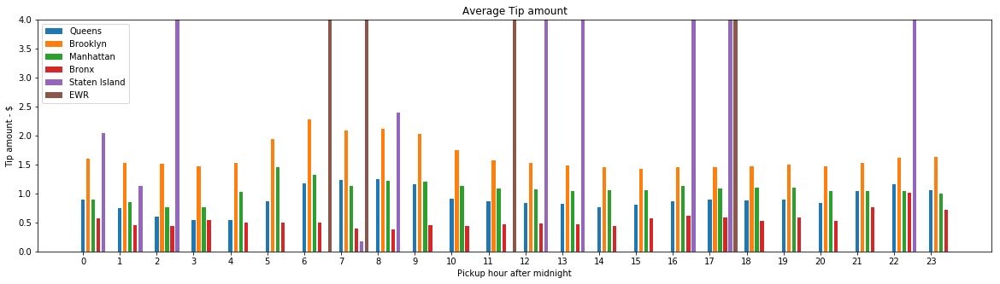

In [180]:
labels = borough
width = 0.10  # the width of the bars

fig, ax = plt.subplots(1,1,figsize = (20,5))
for i in range(len(labels)):
    x = tip_ride_borough.loc[labels[i]].index
    ax.bar(x + width*i*1.4,tip_ride_borough.loc[labels[i]].Tip_amount, width, label=labels[i])


ax.set_ylabel('Tip amount - $')
ax.set_xlabel('Pickup hour after midnight')
ax.set_title('Average Tip amount')
ax.set_xticks(np.arange(0, 24, step=1))
ax.set_ylim(top=4)
ax.legend()

plt.show()

Last 2 graphs also comfirms the bias that trips starting from Brooklyn have higher upside for the taxi drivers

In [181]:
data.columns

Index(['Unnamed: 0', 'VendorID', 'Store_and_fwd_flag', 'RateCodeID',
       'Pickup_longitude', 'Pickup_latitude', 'Dropoff_longitude',
       'Dropoff_latitude', 'Passenger_count', 'Trip_distance', 'Fare_amount',
       'Extra', 'MTA_tax', 'Tip_amount', 'Tolls_amount', 'Ehail_fee',
       'improvement_surcharge', 'Total_amount', 'Payment_type', 'Trip_type ',
       'pickup_date', 'dropoff_date', 'distance_calculated', 'pickup_zone',
       'dropoff_zone', 'pickup_borough', 'pickup_zonename',
       'pickup_servicezone', 'dropoff_borough', 'dropoff_zonename',
       'dropoff_servicezone', 'pickup_hr', 'dropoff_hr', 'pickup_day',
       'dropoff_day', 'trip_time', 'trip_speed', 'Tip_percent_amount',
       'Tip_percent_time'],
      dtype='object')

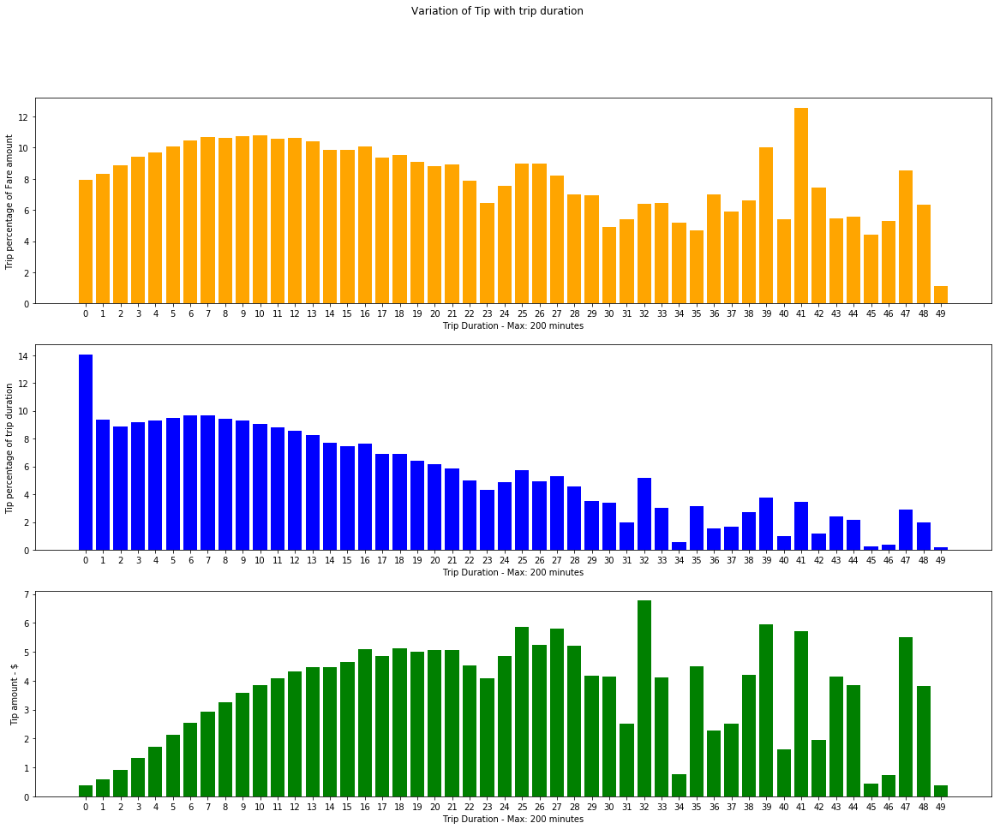

In [182]:
fig,ax = plt.subplots(3,1,figsize = (20,15))
fig.suptitle('Variation of Tip with trip duration')

temp_df = data[['trip_time','Tip_percent_amount','Tip_percent_time','Tip_amount']]
temp_df['trip_time'] = pd.cut(temp_df['trip_time'], 50,labels=range(50))
temp_df = temp_df.groupby('trip_time').mean()

ax[0].bar(temp_df.index,temp_df['Tip_percent_amount'],color='orange')
ax[0].set_xlabel('Trip Duration - Max: 200 minutes')
ax[0].set_xticks(np.arange(0, 50, step=1))
ax[0].set_ylabel('Trip percentage of Fare amount')


ax[1].bar(temp_df.index,temp_df['Tip_percent_time'],color='blue')
ax[1].set_xlabel('Trip Duration - Max: 200 minutes')
ax[1].set_xticks(np.arange(0, 50, step=1))
ax[1].set_ylabel('Tip percentage of trip duration')


ax[2].bar(temp_df.index,temp_df['Tip_amount'],color='green')
ax[2].set_xlabel('Trip Duration - Max: 200 minutes')
ax[2].set_xticks(np.arange(0, 50, step=1))
ax[2].set_ylabel('Tip amount - $')
plt.show()

The above graphs depicts that trips with trip ride o between 30-50 mins will fetch the highest returns when calculated in term per distance or per time basis. This is very crucial analysis for the drivers

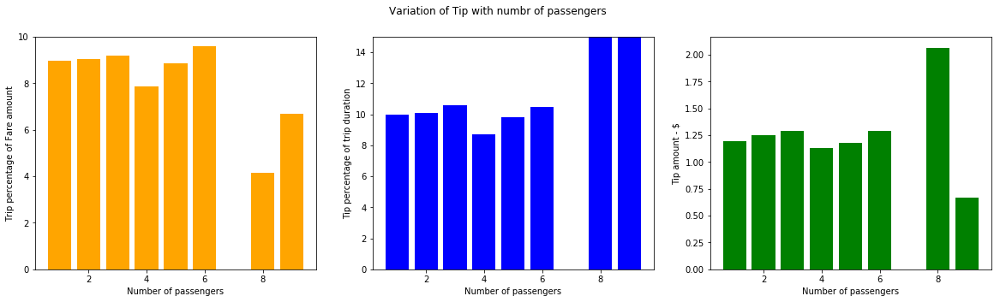

In [183]:
fig,ax = plt.subplots(1,3,figsize = (20,5))
fig.suptitle('Variation of Tip with numbr of passengers')

temp_df = data[['Passenger_count','Tip_percent_amount','Tip_percent_time','Tip_amount']]
temp_df = temp_df.groupby('Passenger_count').mean()

ax[0].bar(temp_df.index,temp_df['Tip_percent_amount'],color='orange')
ax[0].set_xlabel('Number of passengers')
ax[0].set_ylim(top=10)
ax[0].set_ylabel('Trip percentage of Fare amount')

ax[1].bar(temp_df.index,temp_df['Tip_percent_time'],color='blue')
ax[1].set_xlabel('Number of passengers')
ax[1].set_ylim(top=15)
ax[1].set_ylabel('Tip percentage of trip duration')

ax[2].bar(temp_df.index,temp_df['Tip_amount'],color='green')
ax[2].set_xlabel('Number of passengers')
ax[2].set_ylabel('Tip amount - $')
plt.show()

* Although rides with number of passengers less than 2 is in very large proportionate, number of passengers seems to be independent of Tip gathered. 
* It sounds that Uber/Lyft pool service driver will earn higher tips if passengers follow similar behaviours as above. 

In [0]:
def pickup_groupby_mean(data,column_name):
    count_pickup_zone = data.groupby('pickup_zone').mean()
    return count_pickup_zone[[column_name]]

def generate_bokeh_data_mean(df_shape,data,column_name):
    bokeh_data = df_shape.merge(pickup_groupby_mean(data,column_name), 
                          left_on='LocationID', 
                          right_index=True, 
                          how='left')
    return bokeh_data

In [0]:
import bokeh, bokeh.plotting, bokeh.models
from bokeh.io import output_notebook, show, output_file, curdoc
from bokeh.layouts import row, column
from bokeh.models import ColumnDataSource, Slider
from bokeh.plotting import figure

output_notebook()
def bokeh_map_single1(df,column_name):
    gjds = bokeh.models.GeoJSONDataSource(geojson=df.to_json())
    
    tool_list = ['pan','wheel_zoom','reset','hover','lasso_select', 'tap']
    pickup = bokeh.plotting.figure(title="NYC Green Taxi - Tip_percent_amount", tools=tool_list,plot_width=500, plot_height=500)

    blue = bokeh.models.LogColorMapper(palette=bokeh.palettes.Blues9[::-1],low=1, high=20)

    pickup.patches('xs', 'ys', fill_color={'field': 'Tip_percent_amount', 'transform': blue},
                   fill_alpha=1, line_color="gray",source=gjds)


    
    pickup.grid.grid_line_color = None

    hover_pickup = pickup.select_one(bokeh.models.HoverTool)
    hover_pickup.point_policy = "follow_mouse"
    hover_pickup.tooltips = u"""
    <div> 
        <div class="bokeh_hover_tooltip">Name : @zone</div>
        <div class="bokeh_hover_tooltip">Trips Start : @Tip_percent_amount</div>
    </div>
    """

    blue_bar = bokeh.models.ColorBar(color_mapper=blue, 
                                     orientation='horizontal',
                                     ticker=bokeh.models.FixedTicker(ticks=[0.1,0.5,1,5,10]),
                                     formatter=bokeh.models.PrintfTickFormatter(format='%d'),
                                     label_standoff=12, 
                                     border_line_color=None, 
                                     location=(0,0))
    pickup.add_layout(blue_bar, 'above')
   
    p = row(pickup)
    show(p)

In [186]:
bokeh_map_single1(generate_bokeh_data_mean(df_shape,data,'Tip_percent_amount'),'Tip_percent_amount')

Upper Manhattan and Brooklyn riders offer higher tip

In [0]:
import bokeh, bokeh.plotting, bokeh.models
from bokeh.io import output_notebook, show, output_file, curdoc
from bokeh.layouts import row, column
from bokeh.models import ColumnDataSource, Slider
from bokeh.plotting import figure

output_notebook()
def bokeh_map_single2(df,column_name):
    gjds = bokeh.models.GeoJSONDataSource(geojson=df.to_json())
    
    tool_list = ['pan','wheel_zoom','reset','hover','lasso_select', 'tap']
    pickup = bokeh.plotting.figure(title="NYC Green Taxi - Tip_percent_time", tools=tool_list,plot_width=500, plot_height=500)

    blue = bokeh.models.LogColorMapper(palette=bokeh.palettes.Greens9[::-1],low=1, high=20)

    pickup.patches('xs', 'ys', fill_color={'field': 'Tip_percent_time', 'transform': blue},
                   fill_alpha=1, line_color="gray",source=gjds)


    
    pickup.grid.grid_line_color = None

    hover_pickup = pickup.select_one(bokeh.models.HoverTool)
    hover_pickup.point_policy = "follow_mouse"
    hover_pickup.tooltips = u"""
    <div> 
        <div class="bokeh_hover_tooltip">Name : @zone</div>
        <div class="bokeh_hover_tooltip">Trips Start : @Tip_percent_time</div>
    </div>
    """

    blue_bar = bokeh.models.ColorBar(color_mapper=blue, 
                                     orientation='horizontal',
                                     ticker=bokeh.models.FixedTicker(ticks=[0.1,0.5,1,5]),
                                     formatter=bokeh.models.PrintfTickFormatter(format='%d'),
                                     label_standoff=12, 
                                     border_line_color=None, 
                                     location=(0,0))
    pickup.add_layout(blue_bar, 'above')
   
    p = row(pickup)
    show(p)

In [188]:
bokeh_map_single2(generate_bokeh_data_mean(df_shape,data,'Tip_percent_time'),'Tip_percent_time')

Clearly Airports rides offer disproportionaly high tips when compared along with trip durations. 

In [0]:
import bokeh, bokeh.plotting, bokeh.models
from bokeh.io import output_notebook, show, output_file, curdoc
from bokeh.layouts import row, column
from bokeh.models import ColumnDataSource, Slider
from bokeh.plotting import figure

output_notebook()
def bokeh_map_single3(df,column_name):
    gjds = bokeh.models.GeoJSONDataSource(geojson=df.to_json())
    
    tool_list = ['pan','wheel_zoom','reset','hover','lasso_select', 'tap']
    pickup = bokeh.plotting.figure(title="NYC Green Taxi - Tip amount", tools=tool_list,plot_width=500, plot_height=500)

    blue = bokeh.models.LogColorMapper(palette=bokeh.palettes.Oranges9[::-1],low=1, high=2)

    pickup.patches('xs', 'ys', fill_color={'field': 'Tip_amount', 'transform': blue},
                   fill_alpha=1, line_color="gray",source=gjds)


    
    pickup.grid.grid_line_color = None

    hover_pickup = pickup.select_one(bokeh.models.HoverTool)
    hover_pickup.point_policy = "follow_mouse"
    hover_pickup.tooltips = u"""
    <div> 
        <div class="bokeh_hover_tooltip">Name : @zone</div>
        <div class="bokeh_hover_tooltip">Trips Start : @Tip_amount</div>
    </div>
    """

    blue_bar = bokeh.models.ColorBar(color_mapper=blue, 
                                     orientation='horizontal',
                                     ticker=bokeh.models.FixedTicker(ticks=[0.1,0.5,1,2,5]),
                                     formatter=bokeh.models.PrintfTickFormatter(format='%d'),
                                     label_standoff=12, 
                                     border_line_color=None, 
                                     location=(0,0))
    pickup.add_layout(blue_bar, 'above')
   
    p = row(pickup)
    show(p)

In [63]:
bokeh_map_single3(generate_bokeh_data_mean(df_shape,data,'Tip_amount'),'Tip_amount')

In [190]:
data.columns

Index(['Unnamed: 0', 'VendorID', 'Store_and_fwd_flag', 'RateCodeID',
       'Pickup_longitude', 'Pickup_latitude', 'Dropoff_longitude',
       'Dropoff_latitude', 'Passenger_count', 'Trip_distance', 'Fare_amount',
       'Extra', 'MTA_tax', 'Tip_amount', 'Tolls_amount', 'Ehail_fee',
       'improvement_surcharge', 'Total_amount', 'Payment_type', 'Trip_type ',
       'pickup_date', 'dropoff_date', 'distance_calculated', 'pickup_zone',
       'dropoff_zone', 'pickup_borough', 'pickup_zonename',
       'pickup_servicezone', 'dropoff_borough', 'dropoff_zonename',
       'dropoff_servicezone', 'pickup_hr', 'dropoff_hr', 'pickup_day',
       'dropoff_day', 'trip_time', 'trip_speed', 'Tip_percent_amount',
       'Tip_percent_time'],
      dtype='object')

In [191]:
## rate code = 2 or 3
## pickup or dropoff location in JFK, LGA, or EWR
condition = (data['RateCodeID'].isin([2,3]))| (data['pickup_zonename'].isin(['JFK','LGA','EWR'])) | (data['dropoff_zonename'].isin(['JFK','LGA','EWR']))

#calculate airport and non airport trips number
data['airport_trip'] = 'Standard'
data['airport_trip'].loc[condition] = 'Airport'
print('Non - Airport Trips:', data['airport_trip'].value_counts()[0],'Airport Trips',data['airport_trip'].value_counts()[1])

Non - Airport Trips: 1440657 Airport Trips 3301


In [192]:
airport_fare=data[['Total_amount','airport_trip']].groupby(by=['airport_trip']).mean()
airport_fare.columns=['mean_total_amount']
airport_fare['standard_deviation']=data[['Total_amount','airport_trip']].groupby(by=['airport_trip']).std()
airport_fare

,mean_total_amount,standard_deviation
airport_trip,,
Airport,66.964477,17.572623
Standard,14.846376,10.245781


### Tip prediction - Explainable way to taxi drivers
Basic level of cleaning is already done. Here I will examine each attribute and its logical sense

In [193]:
data.columns

Index(['Unnamed: 0', 'VendorID', 'Store_and_fwd_flag', 'RateCodeID',
       'Pickup_longitude', 'Pickup_latitude', 'Dropoff_longitude',
       'Dropoff_latitude', 'Passenger_count', 'Trip_distance', 'Fare_amount',
       'Extra', 'MTA_tax', 'Tip_amount', 'Tolls_amount', 'Ehail_fee',
       'improvement_surcharge', 'Total_amount', 'Payment_type', 'Trip_type ',
       'pickup_date', 'dropoff_date', 'distance_calculated', 'pickup_zone',
       'dropoff_zone', 'pickup_borough', 'pickup_zonename',
       'pickup_servicezone', 'dropoff_borough', 'dropoff_zonename',
       'dropoff_servicezone', 'pickup_hr', 'dropoff_hr', 'pickup_day',
       'dropoff_day', 'trip_time', 'trip_speed', 'Tip_percent_amount',
       'Tip_percent_time', 'airport_trip'],
      dtype='object')

In [0]:
#No need of vendorID
data.drop(columns=['VendorID'],inplace=True)

In [195]:
#RateCodeID
data['RateCodeID'].value_counts()

1    1420756
5      19819
2       2741
3        560
4         74
6          8
Name: RateCodeID, dtype: int64

Most of the rides are with Standard Fares (~98%)


Next:  Latitudes and longitudes are already analysed while performing visualization

In [196]:
data['Passenger_count'].value_counts()

1    1213106
2     110733
5      56490
3      32586
6      21634
4       9391
8         11
7          4
9          3
Name: Passenger_count, dtype: int64

Field with zero passenger counts already removed in the previous analysis

In [197]:
data['Payment_type'].value_counts()

2    758128
1    680224
4      2995
3      2563
5        48
Name: Payment_type, dtype: int64

In [198]:
data[data['Trip_distance']==0].shape

(5250, 39)

#### Removing rows with Trip distance is less than 0.2 as well calculated is also less than 0.2 miles

In [199]:
condition = (data["Trip_distance"]<0.2) & (data["distance_calculated"]<0.2)
print("Data having small trip distance:",data[condition].shape)
data = data[~condition]
print("Remaining Data:",data.shape)

Data having small trip distance: (5574, 39)
Remaining Data: (1438384, 39)


In [200]:
data['Tip_amount'].describe()

count    1.438384e+06
mean     1.202115e+00
std      1.979526e+00
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      2.000000e+00
max      1.000000e+02
Name: Tip_amount, dtype: float64

Since the tip amount data is not available for the Cash payment. We will run the model on only Credit Card payment. However, this the model should also work on cash payments trips. This is becuase the distributions of other variables for payment=Credit and payment=cash are identical and of almost similar size

In [201]:
tip_condition = data['Payment_type']==1
tip_data = data[tip_condition]
tip_data.shape

(679201, 39)

For Taxi Driver, Lets brain storm what are parameters He/She can judge for a trip beforehand to maximize the trip
1. Passenger characteristics (here - number of passengers)
2. Pickup location (here - Brough,Zone)
3. Drop location (here - Borough,Zone). This is important because his/her next trip would probably start from dropping location
4. Time of the day
5. Day for the week

In [0]:
tip_data['time_range']=pd.Series(pd.cut(tip_data['trip_time'],
                                        [0,15,30,60,200],
                                        labels=['15 minutes','30 minutes','60 minutes','60+ minutes'],
                                        include_lowest=True, 
                                        right=False,
                                        retbins=False))

# Uber/Lyft ofer driver 3-hour intervals slot. That means most of the drivers prefer 3 hour slots
labels=['0-2','3-5','6-8','9-11','12-14','15-17','18-20','21-23']
tip_data['pickuphour_range']=pd.Series(pd.cut(tip_data['pickup_hr'], list(np.arange(0,25,3)), labels=labels,right=False))

In [0]:
data.drop(columns=['Store_and_fwd_flag','Ehail_fee'],inplace=True)
tip_data.drop(columns=['Store_and_fwd_flag','Ehail_fee'],inplace=True)

In [204]:
tip_data.columns

Index(['Unnamed: 0', 'RateCodeID', 'Pickup_longitude', 'Pickup_latitude',
       'Dropoff_longitude', 'Dropoff_latitude', 'Passenger_count',
       'Trip_distance', 'Fare_amount', 'Extra', 'MTA_tax', 'Tip_amount',
       'Tolls_amount', 'improvement_surcharge', 'Total_amount', 'Payment_type',
       'Trip_type ', 'pickup_date', 'dropoff_date', 'distance_calculated',
       'pickup_zone', 'dropoff_zone', 'pickup_borough', 'pickup_zonename',
       'pickup_servicezone', 'dropoff_borough', 'dropoff_zonename',
       'dropoff_servicezone', 'pickup_hr', 'dropoff_hr', 'pickup_day',
       'dropoff_day', 'trip_time', 'trip_speed', 'Tip_percent_amount',
       'Tip_percent_time', 'airport_trip', 'time_range', 'pickuphour_range'],
      dtype='object')

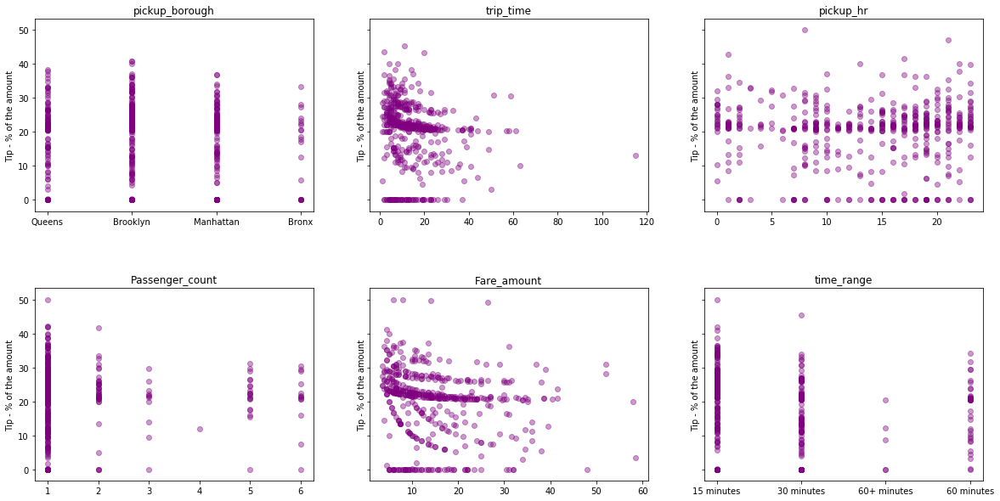

In [205]:
fig, ax = plt.subplots(2,3,figsize=(20,10), sharey=True)
fig.subplots_adjust(hspace=.4)

cont_list =['pickup_borough','trip_time', 'pickup_hr', 'Passenger_count', 'Fare_amount', 'time_range']

for i, variable in enumerate(cont_list):
    graph_data=tip_data.sample(500)
    ax[i//3][(i+3) % 3].scatter(x=graph_data[variable], y=graph_data['Tip_percent_amount'],color='purple', alpha=.4)
    ax[i//3][(i+3) % 3].set(title=variable, ylabel='Tip - % of the amount');

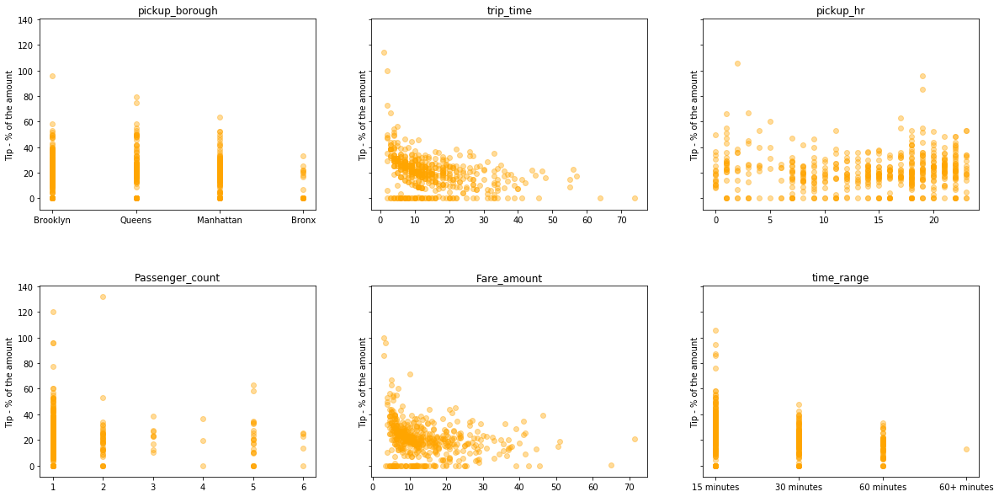

In [207]:
fig, ax = plt.subplots(2,3,figsize=(20,10), sharey=True)
fig.subplots_adjust(hspace=.4)

cont_list =['pickup_borough','trip_time', 'pickup_hr', 'Passenger_count', 'Fare_amount', 'time_range']

for i, variable in enumerate(cont_list):
    graph_data=tip_data.sample(500)
    ax[i//3][(i+3) % 3].scatter(x=graph_data[variable], y=graph_data['Tip_percent_time'],color='Orange', alpha=.4)
    ax[i//3][(i+3) % 3].set(title=variable, ylabel='Tip - % of the amount');

The first question is what parameter is most important for the drivers
From the different revolts from Uber/Lyft driver, many times they complain about not getting enough paid for the hours they put in.
* Hence the intial hypothesis was there are 2 metric driver are concerned about
  1. Tip per unit time
  2. Tip % of the fare amount

* The above 12 graphs suggest that, Tip are very likely related with fare amount rather than Tip per unit time. Clearly frund om graphs with Trip time, Pickup hour and fare amount vagues suggest that tipping culture is around 20% of the base fare

Hence we apply the model on Tip % amount to understand the tipping patterns

In [208]:
tip_data['pickup_servicezone'].value_counts()

Boro Zone      667534
Yellow Zone     11564
Airports          103
Name: pickup_servicezone, dtype: int64

In [209]:
tip_data.head(5)

,Unnamed: 0,RateCodeID,Pickup_longitude,Pickup_latitude,Dropoff_longitude,Dropoff_latitude,Passenger_count,Trip_distance,Fare_amount,Extra,MTA_tax,Tip_amount,Tolls_amount,improvement_surcharge,Total_amount,Payment_type,Trip_type,pickup_date,dropoff_date,distance_calculated,pickup_zone,dropoff_zone,pickup_borough,pickup_zonename,pickup_servicezone,dropoff_borough,dropoff_zonename,dropoff_servicezone,pickup_hr,dropoff_hr,pickup_day,dropoff_day,trip_time,trip_speed,Tip_percent_amount,Tip_percent_time,airport_trip,time_range,pickuphour_range
2,2,1,-73.921410,40.766708,-73.914413,40.764687,1,0.59,4.0,0.5,0.5,0.50,0.0,0.3,5.80,1,1.0,2015-09-01 00:01:50,2015-09-01 00:04:24,0.392664,7.0,7.0,Queens,Astoria,Boro Zone,Queens,Astoria,Boro Zone,0,0,Tuesday,Tuesday,2.0,17.70,12.500000,25.0,Standard,15 minutes,0-2
5,5,1,-73.945297,40.808186,-73.937668,40.821198,1,1.07,5.5,0.5,0.5,1.36,0.0,0.3,8.16,1,1.0,2015-09-01 00:00:39,2015-09-01 00:05:20,0.982928,41.0,42.0,Manhattan,Central Harlem,Boro Zone,Manhattan,Central Harlem North,Boro Zone,0,0,Tuesday,Tuesday,4.0,16.05,24.727273,34.0,Standard,15 minutes,0-2
6,6,1,-73.890877,40.746426,-73.876923,40.756306,1,1.43,6.5,0.5,0.5,0.00,0.0,0.3,7.80,1,1.0,2015-09-01 00:00:52,2015-09-01 00:05:50,1.000485,82.0,129.0,Queens,Elmhurst,Boro Zone,Queens,Jackson Heights,Boro Zone,0,0,Tuesday,Tuesday,4.0,21.45,0.000000,0.0,Standard,15 minutes,0-2
8,8,1,-73.963150,40.693829,-73.956787,40.680531,1,1.33,6.0,0.5,0.5,1.46,0.0,0.3,8.76,1,1.0,2015-09-01 00:02:36,2015-09-01 00:07:20,0.976561,49.0,49.0,Brooklyn,Clinton Hill,Boro Zone,Brooklyn,Clinton Hill,Boro Zone,0,0,Tuesday,Tuesday,4.0,19.95,24.333333,36.5,Standard,15 minutes,0-2
11,11,1,-73.905540,40.772526,-73.895363,40.768963,1,0.70,4.0,0.5,0.5,1.06,0.0,0.3,6.36,1,1.0,2015-09-01 00:04:00,2015-09-01 00:06:06,0.587801,223.0,223.0,Queens,Steinway,Boro Zone,Queens,Steinway,Boro Zone,0,0,Tuesday,Tuesday,2.0,21.00,26.500000,53.0,Standard,15 minutes,0-2


In [0]:
# Import necessary libraries to build model
import statsmodels.api as sm
from statsmodels.tools.eval_measures import mse
from statsmodels.formula.api import ols

from sklearn.preprocessing import PolynomialFeatures,StandardScaler
import sklearn.model_selection
import sklearn.metrics
from sklearn_pandas import DataFrameMapper

In [0]:
tip_data_wo_dummy = tip_data.copy()

In [0]:
# create dummy variables
tip_data = pd.get_dummies(tip_data, columns=['Passenger_count','pickup_borough','pickup_servicezone',
                                   'dropoff_borough','dropoff_servicezone','pickup_day','airport_trip',
                                   'time_range','pickuphour_range'])

In [213]:
tip_data.columns

Index(['Unnamed: 0', 'RateCodeID', 'Pickup_longitude', 'Pickup_latitude',
       'Dropoff_longitude', 'Dropoff_latitude', 'Trip_distance', 'Fare_amount',
       'Extra', 'MTA_tax', 'Tip_amount', 'Tolls_amount',
       'improvement_surcharge', 'Total_amount', 'Payment_type', 'Trip_type ',
       'pickup_date', 'dropoff_date', 'distance_calculated', 'pickup_zone',
       'dropoff_zone', 'pickup_zonename', 'dropoff_zonename', 'pickup_hr',
       'dropoff_hr', 'dropoff_day', 'trip_time', 'trip_speed',
       'Tip_percent_amount', 'Tip_percent_time', 'Passenger_count_1',
       'Passenger_count_2', 'Passenger_count_3', 'Passenger_count_4',
       'Passenger_count_5', 'Passenger_count_6', 'Passenger_count_7',
       'Passenger_count_8', 'Passenger_count_9', 'pickup_borough_Bronx',
       'pickup_borough_Brooklyn', 'pickup_borough_Manhattan',
       'pickup_borough_Queens', 'pickup_borough_Staten Island',
       'pickup_servicezone_Airports', 'pickup_servicezone_Boro Zone',
       'pickup_ser

In [0]:
mapper = DataFrameMapper([(['Fare_amount', 'Extra','Tolls_amount', 'MTA_tax','improvement_surcharge', 'trip_speed','Trip_distance'],[StandardScaler()]),
        (['Passenger_count_1',
          'Passenger_count_2', 
          'Passenger_count_3', 
          'Passenger_count_4',
          'Passenger_count_5', 
          'Passenger_count_6', 
          'Passenger_count_7',
          'Passenger_count_8', 
          'Passenger_count_9',
          'pickup_borough_Bronx',
          'pickup_borough_Brooklyn', 
          'pickup_borough_Manhattan',
          'pickup_borough_Queens', 
          'pickup_borough_Staten Island',
          'pickup_servicezone_Airports', 
          'pickup_servicezone_Boro Zone',
          'pickup_servicezone_Yellow Zone', 
          'dropoff_borough_Bronx',
          'dropoff_borough_Brooklyn', 
          'dropoff_borough_EWR',
          'dropoff_borough_Manhattan', 
          'dropoff_borough_Queens',
          'dropoff_borough_Staten Island', 
          'dropoff_servicezone_Airports',
          'dropoff_servicezone_Boro Zone', 
          'dropoff_servicezone_EWR',
          'dropoff_servicezone_Yellow Zone', 
          'pickup_day_Friday',
          'pickup_day_Monday', 
          'pickup_day_Saturday', 
          'pickup_day_Sunday',
          'pickup_day_Thursday', 
          'pickup_day_Tuesday', 
          'pickup_day_Wednesday',
          'airport_trip_Airport', 
          'airport_trip_Standard',
          'time_range_15 minutes', 
          'time_range_30 minutes',
          'time_range_60 minutes', 
          'time_range_60+ minutes',
          'pickuphour_range_0-2', 
          'pickuphour_range_3-5', 
          'pickuphour_range_6-8',
          'pickuphour_range_9-11', 
          'pickuphour_range_12-14',
          'pickuphour_range_15-17', 
          'pickuphour_range_18-20',
          'pickuphour_range_21-23'], None)])

In [0]:
X_train, X_test, y_train, y_test = train_test_split(mapper.fit_transform(tip_data), tip_data['Tip_percent_amount'], test_size=0.2, random_state=42)

### Linear Regression

In [216]:
model = sm.OLS(y_train, sm.add_constant(X_train)).fit()
predictions = model.predict(sm.add_constant(X_test))

model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:     Tip_percent_amount   R-squared:                       0.070
Model:                            OLS   Adj. R-squared:                  0.070
Method:                 Least Squares   F-statistic:                     914.7
Date:                Sun, 06 Oct 2019   Prob (F-statistic):               0.00
Time:                        08:33:44   Log-Likelihood:            -1.9979e+06
No. Observations:              543360   AIC:                         3.996e+06
Df Residuals:                  543314   BIC:                         3.997e+06
Df Model:                          45                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const           2e+11   3.86e+11      0.518      0.605   -5.57e+11    9.57e+11
x1            -1.6287      0.057    -28.419      0.000      -1.741      -1.516
x2             0.4709      0.020     23.832      0.000       0.432       0.510
x3             0.8461      0.015     58.177      0.000       0.818       0.875
x4             0.3238      0.035      9.379      0.000       0.256       0.391
x5             0.0625      0.033      1.888      0.059      -0.002       0.127
x6             0.2705      0.021     13.066      0.000       0.230       0.311
x7            -0.1996      0.056     -3.544      0.000      -0.310      -0.089
x8          1.293e+11    2.5e+11      0.518      0.605    -3.6e+11    6.19e+11
x9          1.293e+11    2.5e+11      0.518      0.605    -3.6e+11    6.19e+11
x10         1.293e+11    2.5e+11      0.518      0.605    -3.6e+11    6.19e+11
x11         1.293e+11    2.5e+11      0.518      0.605    -3.6e+11    6.19e+11
x12         1.293e+11    2.5e+11      0.518      0.605    -3.6e+11    6.19e+11
x13         1.293e+11    2.5e+11      0.518      0.605    -3.6e+11    6.19e+11
x14        -3.704e+09   7.15e+09     -0.518      0.605   -1.77e+10    1.03e+10
x15         1.293e+11    2.5e+11      0.518      0.605    -3.6e+11    6.19e+11
x16         1.293e+11    2.5e+11      0.518      0.605    -3.6e+11    6.19e+11
x17         1.198e+11   2.31e+11      0.518      0.605   -3.34e+11    5.73e+11
x18         1.198e+11   2.31e+11      0.518      0.605   -3.34e+11    5.73e+11
x19         1.198e+11   2.31e+11      0.518      0.605   -3.34e+11    5.73e+11
x20         1.198e+11   2.31e+11      0.518      0.605   -3.34e+11    5.73e+11
x21         1.198e+11   2.31e+11      0.518      0.605   -3.34e+11    5.73e+11
x22        -3.499e+11   6.76e+11     -0.518      0.605   -1.67e+12    9.74e+11
x23        -3.499e+11   6.76e+11     -0.518      0.605   -1.67e+12    9.74e+11
x24        -3.499e+11   6.76e+11     -0.518      0.605   -1.67e+12    9.74e+11
x25         -7.21e+10   1.39e+11     -0.518      0.605   -3.45e+11    2.01e+11
x26         -7.21e+10   1.39e+11     -0.518      0.605   -3.45e+11    2.01e+11
x27         3.142e+11   6.07e+11      0.518      0.605   -8.75e+11     1.5e+12
x28         -7.21e+10   1.39e+11     -0.518      0.605   -3.45e+11    2.01e+11
x29         -7.21e+10   1.39e+11     -0.518      0.605   -3.45e+11    2.01e+11
x30         -7.21e+10   1.39e+11     -0.518      0.605   -3.45e+11    2.01e+11
x31         7.138e+11   1.38e+12      0.518      0.605   -1.99e+12    3.42e+12
x32         7.138e+11   1.38e+12      0.518      0.605   -1.99e+12    3.42e+12
x33         3.275e+11   6.33e+11      0.518      0.605   -9.12e+11    1.57e+12
x34         7.138e+11   1.38e+12      0.518      0.605   -1.99e+12    3.42e+12
x35         1.074e+11   2.07e+11      0.518      0.605   -2.99e+11    5.14e+11
x3

In [218]:
from sklearn.metrics import explained_variance_score
print('RMSE=',np.sqrt(mse(predictions, y_test)))
print('R-square=',explained_variance_score(y_test, predictions))

RMSE= 360956687.85188466
R-square= -1324476132130596.0


The linear regression model suggest the following insights
* Only few attributes affect the tip percentage
      1. Fare_amount
      2. Extra
      3. Tolls_amount
      4. MTA_tax
      5. improvement_surcharge
      6. trip_speed
      7. Trip_distance
* The p values of all the other attributes are way higher depcited they dont contribute to the tip percentage
* The Beta coefficients of the above 7 parametrs is also low
* This suggestion that model is having very high capacity, hence overfit over the data
* The results also bring the thoughts regadring the obersvation of constant Tip percentage(~20%) obeserved from the data analysis


### Let us try robust algorithms like Random Forest, Ridge to rank the features

In [219]:
from sklearn.linear_model import Lasso,LassoCV
lasso_model = LassoCV(alphas=[0.01,0.1,0.5,1,5,10,50,100]) #Regularization penalty
lasso_model.fit(X_train, y_train)
lasso_train_score = lasso_model.score(X_train,y_train)
lasso_test_score = lasso_model.score(X_test, y_test)
print('Train coefficient R^2=',lasso_train_score)
print('Test coefficient R^2=',lasso_test_score)

Train coefficient R^2= 0.06983605270218174
Test coefficient R^2= 0.06735216982444492


In [220]:
lasso_model.coef_

array([-1.4887613 ,  0.4549872 ,  0.8658844 ,  0.21864481,  0.16037729,
        0.20014747, -0.15697734, -0.0831102 ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        , -0.        ,
        0.        , -2.54212976,  1.21449777, -0.34747847,  0.23268889,
       -0.        ,  0.        , -0.28473936,  0.        , -4.79943622,
        0.52694658,  0.        , -1.16586493,  0.        , -0.        ,
        0.38752453, -1.9108688 ,  0.        , -0.        , -0.05709696,
       -0.        , -0.        ,  0.        ,  0.        ,  0.        ,
        0.03407626,  0.        , -0.        ,  0.09031114, -1.05462678,
       -0.        ,  0.32985294, -0.        , -0.60150358, -0.3091141 ,
        0.        ,  0.        , -0.        ,  0.30324998,  0.27616   ])

The result from the regulaized linear regression also suggest similar insights as of linear regression

In [128]:
import xgboost 
from sklearn.model_selection import cross_val_score, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import MinMaxScaler
rf = RandomForestRegressor(n_estimators = 50, random_state = 42)

rf.fit(X_train, y_train);
predictions = rf.predict(X_test)
errors = abs(predictions - y_test)

print('Mean Absolute Error:', round(np.mean(errors), 2))
print('Explained Variance:',explained_variance_score(predictions,y_test))

Mean Absolute Error: 7.87
-3.231641375486622


In [0]:
X_train, X_test, y_train, y_test = train_test_split(tip_data_wo_dummy, tip_data['Tip_percent_amount'], test_size=1, random_state=42)

### Baseline Model - Flat 20% Tip. The Purple graphs on the baove indicates the likely Tip percentage of the base fare amount

In [225]:
predictions = [20]*y_test.shape[0]
print('RMSE=',np.sqrt(mse(predictions, y_test)))
print('Mean Absolute Error:', round(np.mean(abs(predictions - y_test)), 2))

RMSE= 6.666666666666666
Mean Absolute Error: 6.67


The heuristic 20% Tip precentage predict does better than all 3 models. 
1. This suggest people tip with similar percentages of that eating places (~18-20%)

### Advice to Taxi driver to earn higher tips

1. Choose airport rides over standard rides (Any JFK, LGA, Newark).
2. Brooklyn should be prefred area of serive considering 
    * High tip percentage
    * Tip per unit time
    * Tip amount
3. If you are not able to find the rides, you should operate in Upper Manhattan region during the day and Brooklyn(East River side) during late evenings
4. Trips with 30-50 mins wold result in maximum tip earning considering you get enough passengers
5. Early morning(between 5 AM and 8 AM) prefer taking longer trips, as number trips would be low and most of the customers would be travelling a long distance for work
6. Late evenings(between 9 PM and 1 AM) prefer shorter rides, preferably in Brooklyn over Manhattan, to obtain large tip amount by doing frequenct short trips
7. Prefer other regions over Staten Island and Bronx
